<a href="https://colab.research.google.com/github/Guhan2348519/demo/blob/main/2348519_cv_lab6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Median filters, max filters, min filters, mid-point filters, and alpha-trimmed filters are all types of filters used in image processing that remove noise and smooth out images.

In [1]:
#importing necessary libraries
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt


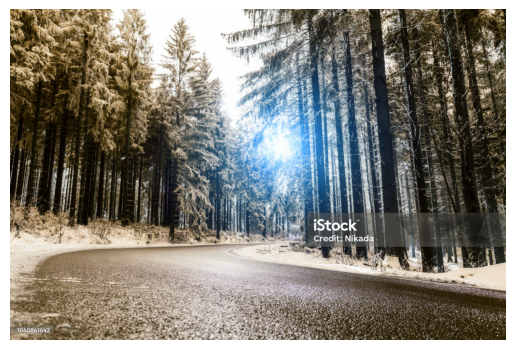

In [2]:
img = cv2.imread('/content/drive/MyDrive/cvimg.jpg')
plt.imshow(img)
plt.axis('off')
plt.show()

Median filters, max filters, min filters, mid-point filters, and alpha-trimmed filters are all types of filters used in image processing that remove noise and smooth out images.

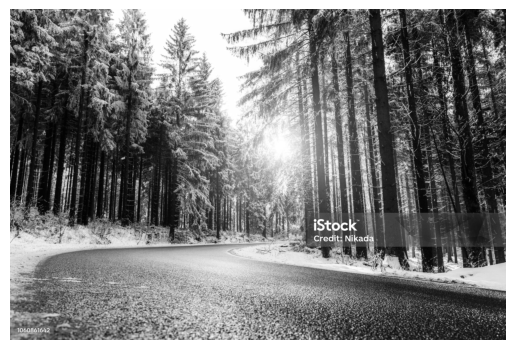

In [3]:
# Convert the image to grayscale
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Display the grayscale image
plt.imshow(img_gray, cmap='gray')
plt.axis('off')
plt.show()

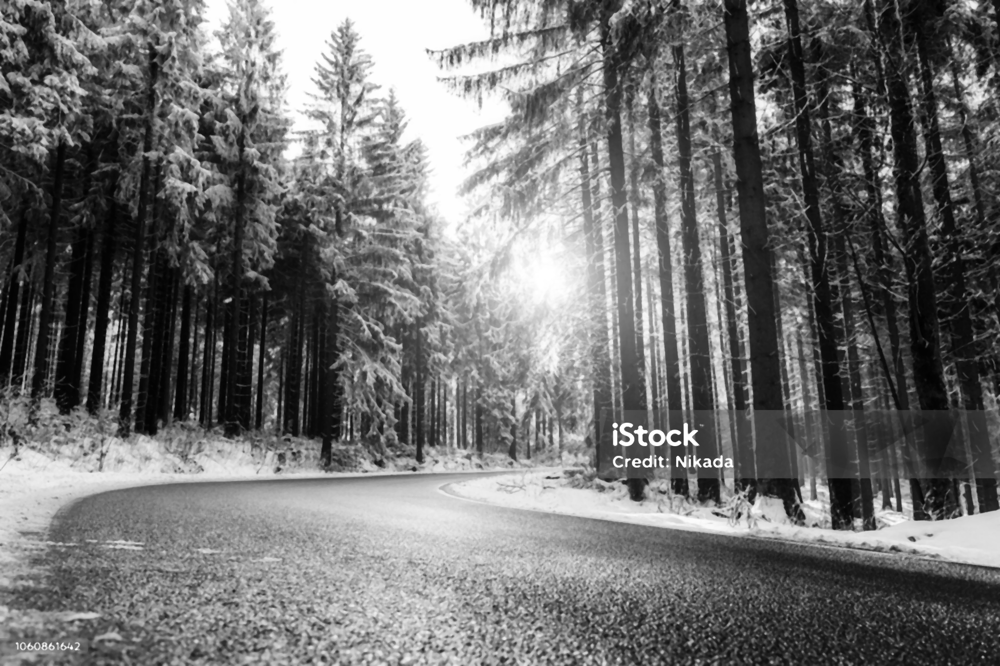

In [4]:
from scipy.ndimage import median_filter, maximum_filter, minimum_filter
median_filtered_img = cv2.medianBlur(img_gray,5)
cv2_imshow(median_filtered_img)

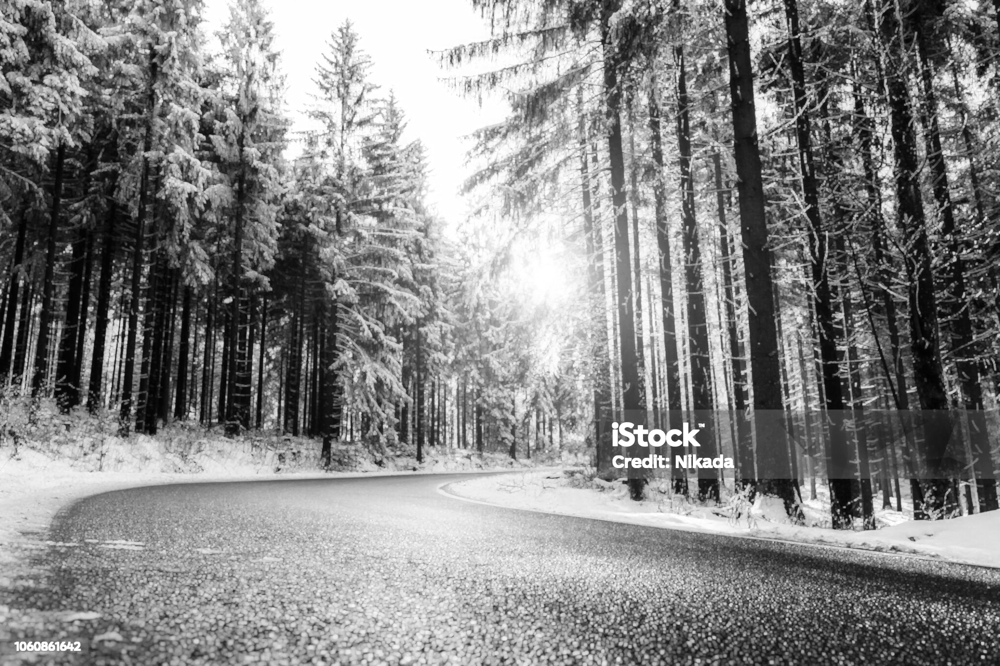

In [5]:
#max Filter(built in)
max_filter = maximum_filter(img_gray, size=3)
cv2_imshow(max_filter)

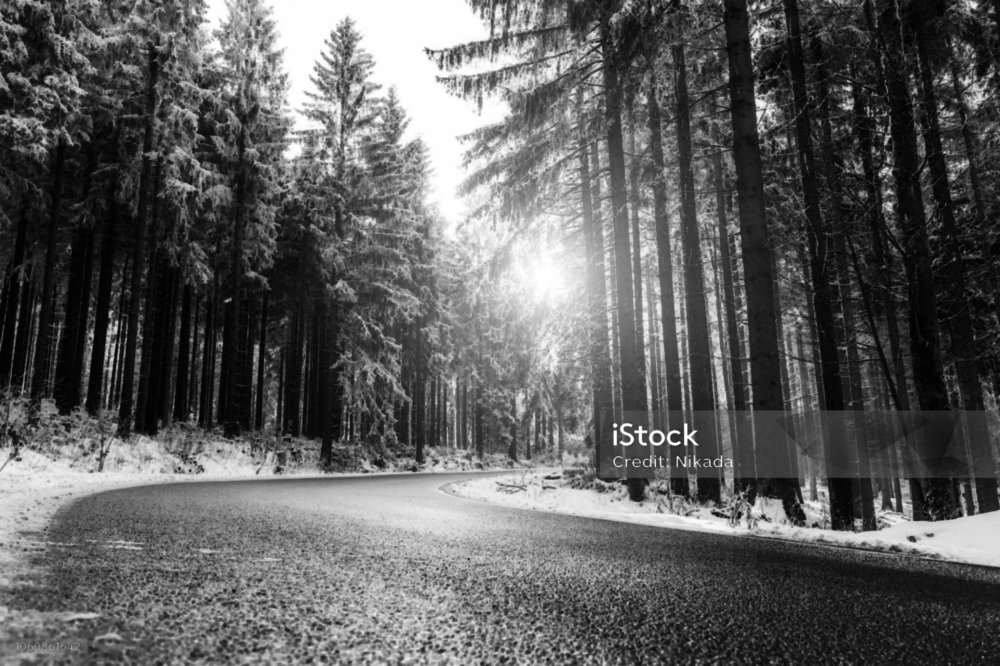

In [6]:
#built in function min filter
min_filter = minimum_filter(img_gray, size=3)
cv2_imshow(min_filter)



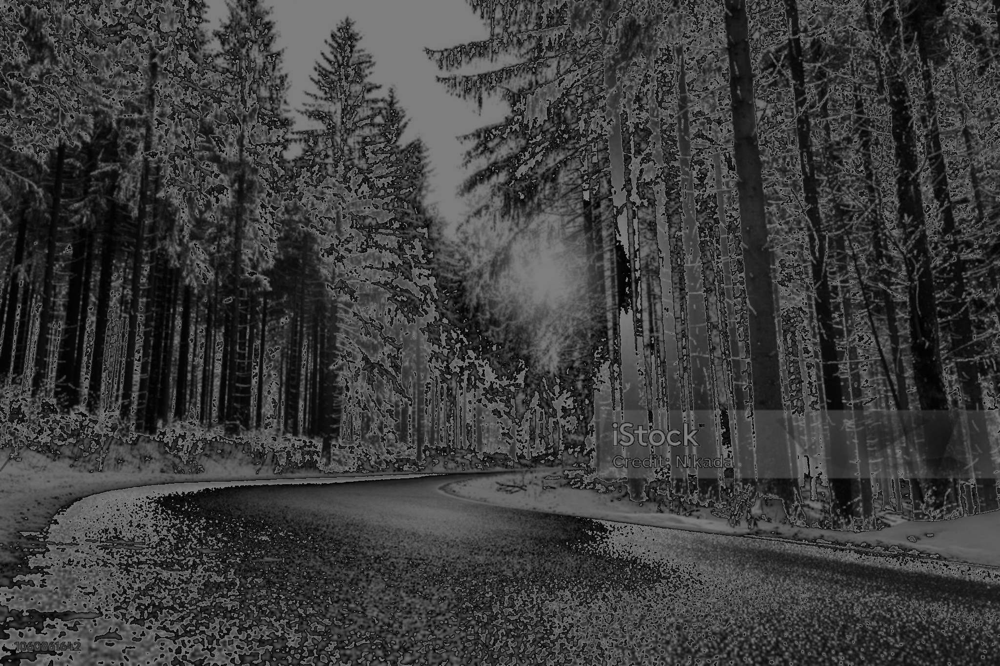

In [7]:
#midpoint filter (built in)
def midpoint_filter(image, kernel_size):
    max_filtered = maximum_filter(img_gray, kernel_size)
    min_filtered = minimum_filter(img_gray, kernel_size)
    result = (max_filtered + min_filtered) / 2
    return result
midpoint_filter_built_in = midpoint_filter(img_gray, kernel_size=3)
cv2_imshow(midpoint_filter_built_in)

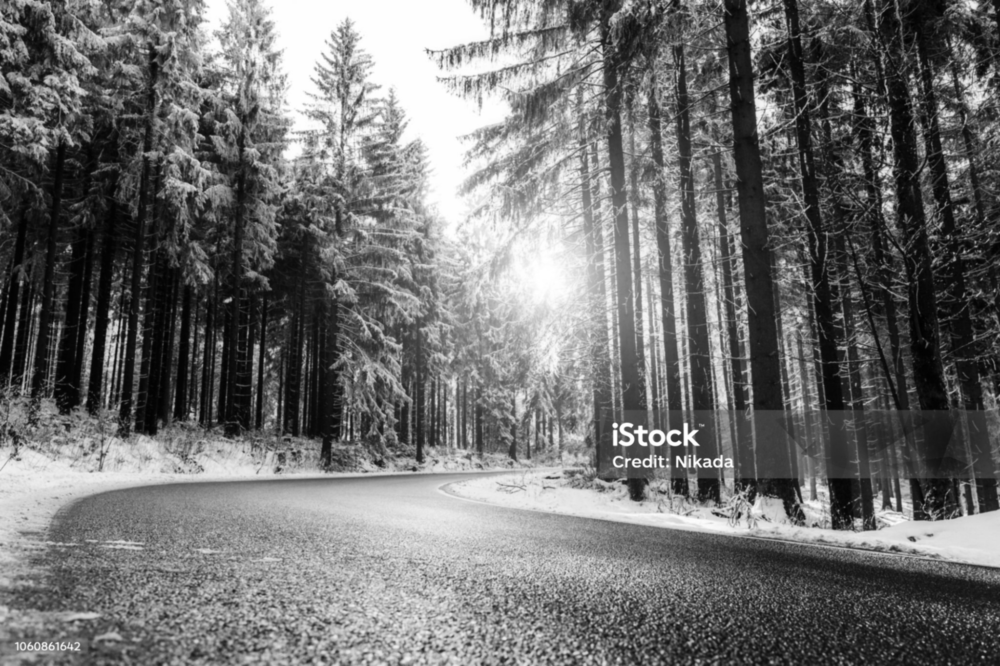

In [8]:
from scipy.ndimage import generic_filter

def alpha_trimmed_filter(image, kernel_size, alpha):
    def alpha_trimmed_mean(data):
        sorted_data = np.sort(data)
        trimmed_data = sorted_data[alpha:-alpha]
        return np.mean(trimmed_data)
    result = generic_filter(image, alpha_trimmed_mean, size=kernel_size)
    return result
alpha_trimmed_filter_built_in = alpha_trimmed_filter(img_gray, kernel_size=3, alpha=1)
cv2_imshow(alpha_trimmed_filter_built_in)


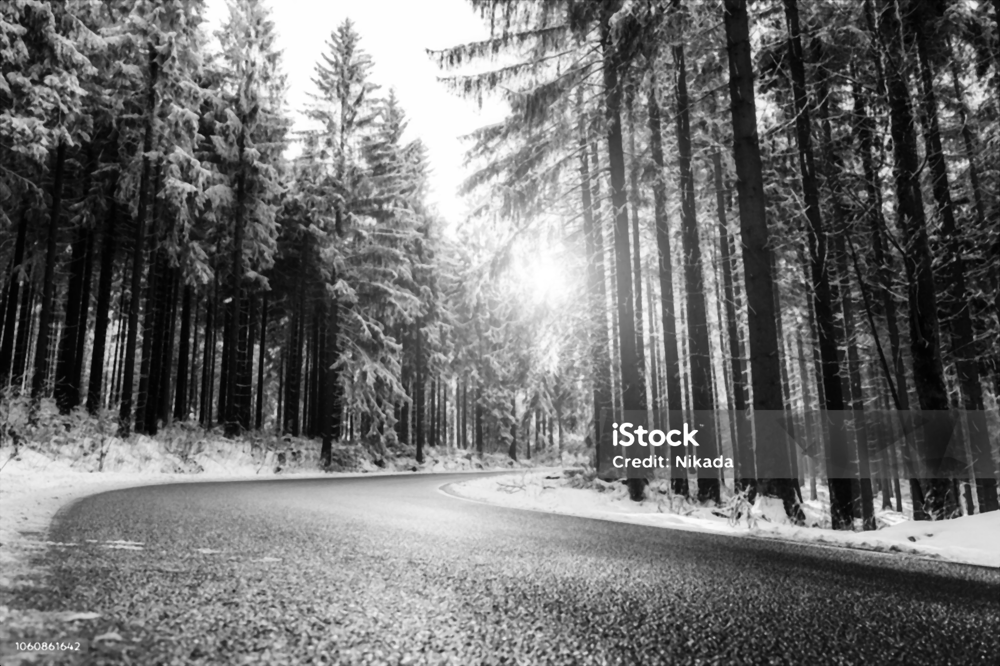

In [9]:
#user defined
def median_filter(img, kernel_size):
    result = np.zeros_like(img_gray)
    padding = kernel_size // 2
    padded_image = cv2.copyMakeBorder(img_gray, padding, padding, padding, padding, cv2.BORDER_CONSTANT)
    for i in range(padding, img_gray.shape[0] + padding):
        for j in range(padding, img_gray.shape[1] + padding):
            neighbors = padded_image[i - padding : i + padding + 1, j - padding : j + padding + 1].ravel()
            result[i - padding, j - padding] = np.median(neighbors)
    return result

# Apply user-defined median filter
median_filter = median_filter(img_gray, 5)
cv2_imshow(median_filter)

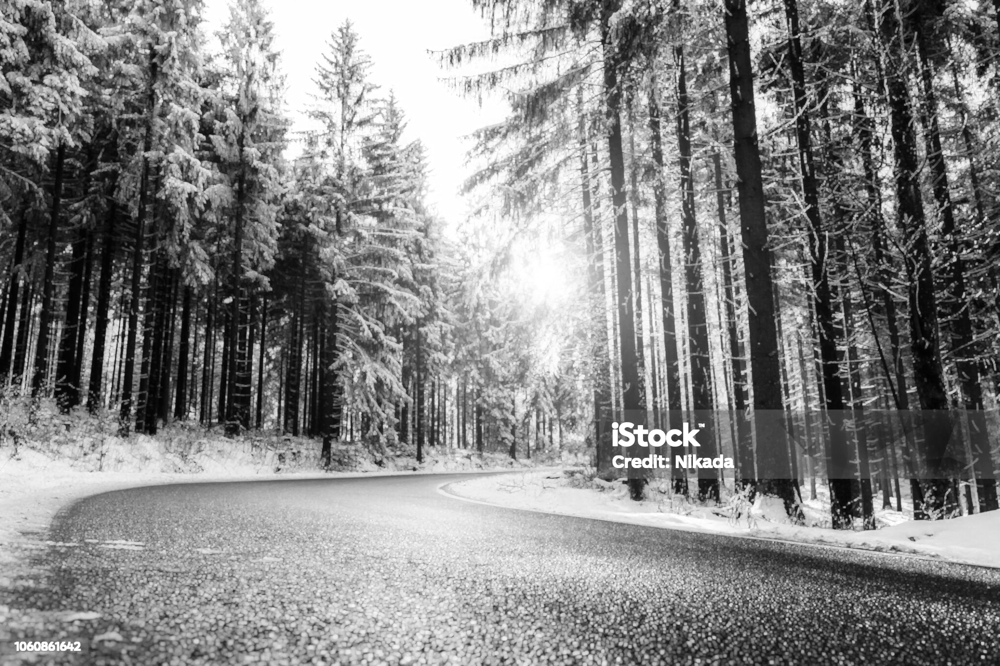

In [10]:

#max filter user defined
def max_filter_custom(image, kernel_size):
    result = np.zeros_like(img_gray)
    padded_image = np.pad(img_gray, ((kernel_size // 2, ), (kernel_size // 2, )), mode='constant')
    for i in range(img_gray.shape[0]):
        for j in range(img_gray.shape[1]):
            neighbors = padded_image[i:i+kernel_size, j:j+kernel_size].flatten()
            result[i, j] = np.max(neighbors)
    return result
max_filtered_image_custom = max_filter_custom(img_gray, kernel_size=3)
cv2_imshow(max_filtered_image_custom)

<ipython-input-11-6506c468ae51>:9: RuntimeWarning: overflow encountered in scalar add
  midpoint = (np.max(neighbors) + np.min(neighbors)) / 2


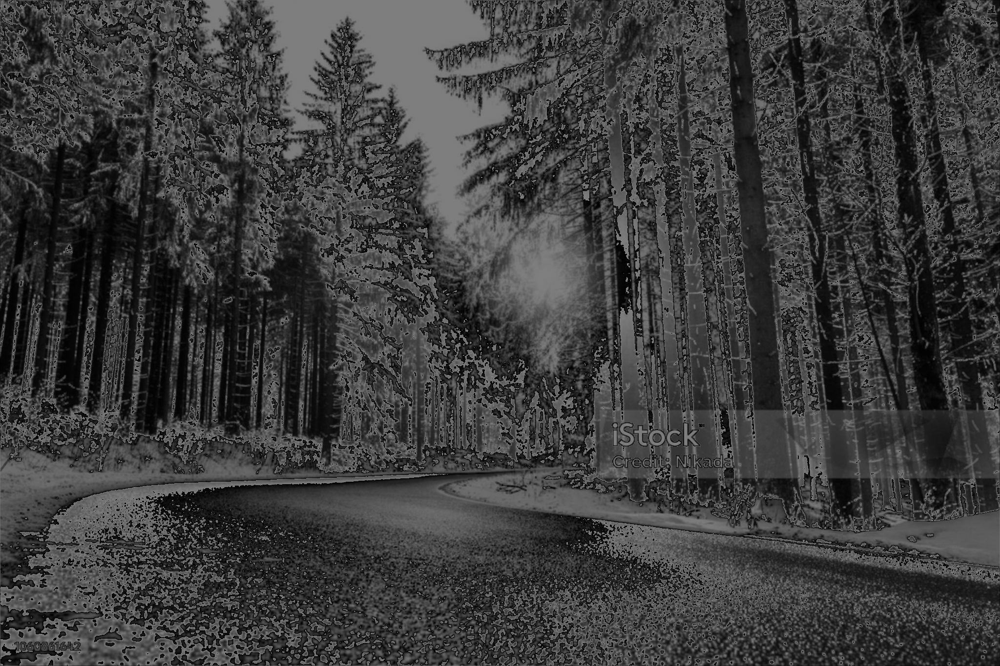

In [11]:
import numpy as np

def midpoint_filter_custom(image, kernel_size):
    result = np.zeros_like(image)
    padded_image = np.pad(image, ((kernel_size // 2, ), (kernel_size // 2, )), mode='constant')
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            neighbors = padded_image[i:i+kernel_size, j:j+kernel_size].flatten()
            midpoint = (np.max(neighbors) + np.min(neighbors)) / 2
            result[i, j] = midpoint
    return result

midpoint_filtered_image_custom = midpoint_filter_custom(img_gray, kernel_size=3)
cv2_imshow(midpoint_filtered_image_custom)
